In [2]:
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
%matplotlib inline
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
import cufflinks as cf
cf.go_offline()
import plotly.express as px
import json
import IPython.display as ipd
from plotly.subplots import make_subplots

## Data Overview

In [11]:
folder_path = '/Users/badgod/badgod_documents/Datasets/covid19/covid_mit_audio_data/'
csv_file = '/Users/badgod/badgod_documents/Datasets/covid19/covid_mit_audio_data/diagnosis.csv'

data = pd.read_csv(csv_file)
data = data.rename({'diagnosis':'Covid Status'},axis=1)
data.head()

,id,Covid Status,age,gender,country,height,smokingHabits
0,5e72e93a38d9b5000737f3aa,No,44,Male,United States,"{'value': 6.25, 'unit': 'Feet'}",I've never smoked
1,5e72f4ed93d85c0008831262,No,53,Male,Mexico,"{'value': 185, 'unit': 'Centimeters'}",I've used to smoke
2,5e72f6bb93d85c0008831263,No,52,Male,United States,"{'value': 167, 'unit': 'Centimeters'}",I've never smoked
3,5e72f8bb93d85c0008831264,No,52,Male,United States,"{'value': 167, 'unit': 'Centimeters'}",I've never smoked
4,5e72fd8b319d5b000813f71c,No,34,Male,United States,"{'value': 170, 'unit': 'Centimeters'}",I currently smoke


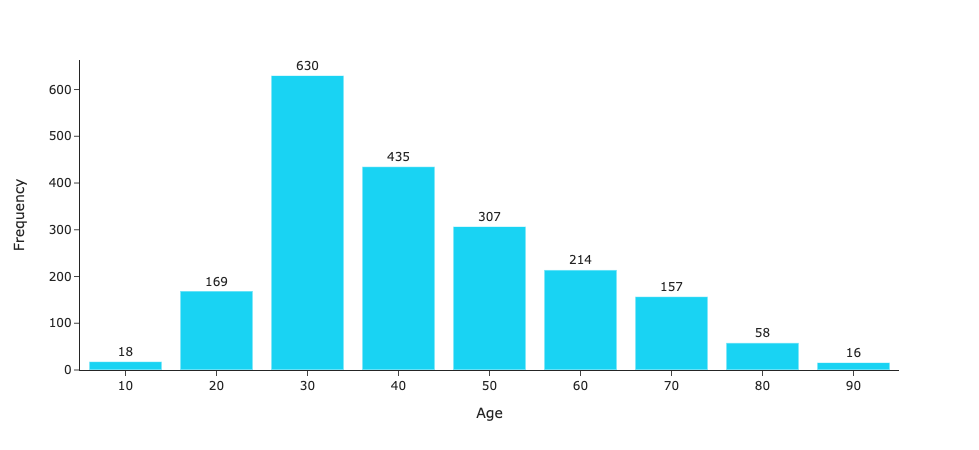

In [12]:
# AGE plots
# age = data['age'].apply(lambda x: int(x) if len(str(x))<=2 else 10)
# plt.figure()
# plt.hist(age.values, bins=10)
# plt.xlabel('Age')
# plt.ylabel('Frequency')
# plt.savefig('plots/mit_age.eps', format='eps')
# plt.show()
# plt.close()
age = data['age'].apply(lambda x: int(x) if len(str(x))<=2 else 10)
c, rnge = np.histogram(age.values,bins=[x*10 for x in range(0,10)])
age_fig = px.bar(x=rnge[1:],y=c,template="simple_white",labels={'x':'Age','y':'Frequency'},text=c)
# fig = px.histogram(x=age.values,nbins=8,template="simple_white",labels={'x':'Age','y':'Frequency'})
age_fig.update_traces(marker_color='#19D3F3')
age_fig.data[0].textposition = 'outside'
age_fig.write_image('plots/mit_plots/mit_age_plotly.eps')
age_fig.show()

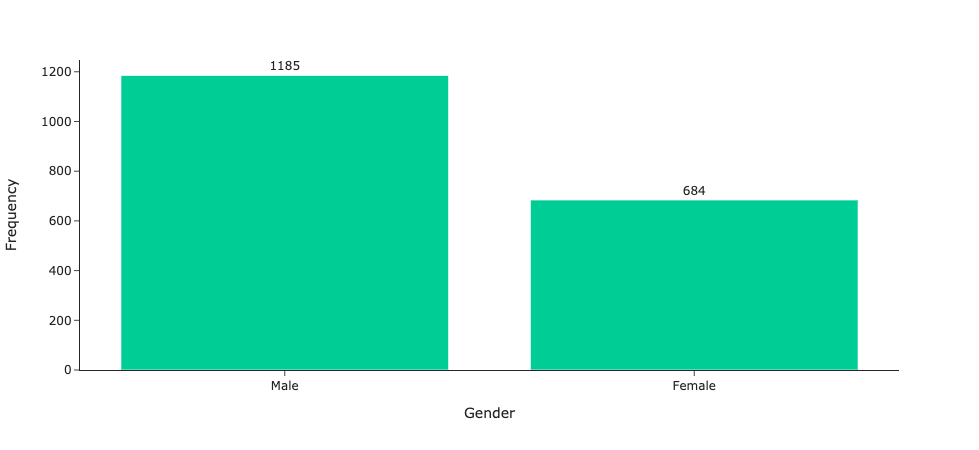

In [13]:
# GENDER
data_cleaned = data.dropna()
# d = data_cleaned[['id','diagnosis','gender']].groupby("diagnosis")['gender'].value_counts().unstack(fill_value=0)
# d.loc['percentage(in %)'] = (d.loc['Yes'] / d.loc['No'] * 100).round(1)
# d

data_cleaned = data_cleaned[data_cleaned['gender']!='Other']
gender_fig = px.bar(x=data_cleaned['gender'].unique(),y=data_cleaned['gender'].value_counts(),
             template="simple_white",labels={'x':'Gender','y':'Frequency'},
            text=data_cleaned['gender'].value_counts())
gender_fig.update_traces(marker_color='#00CC96')
gender_fig.data[0].textposition = 'outside'
gender_fig.write_image('plots/mit_plots/mit_gender_plotly.eps')
gender_fig.show()

In [14]:
# HEIGHT
age = data['height'].dropna()
age = age.values
final = []
for e, x in enumerate(age):
    try:
        x = eval(x)
    except:
        continue
    if isinstance(x, dict) and 'value' in x and x['value'] is not None and isinstance(x['value'],(int, float)):
        final.append(x['value']*30.48 if x['unit'] == 'Feet' else x['value'])
min(final), max(final)

(0.0, 5496.7632)

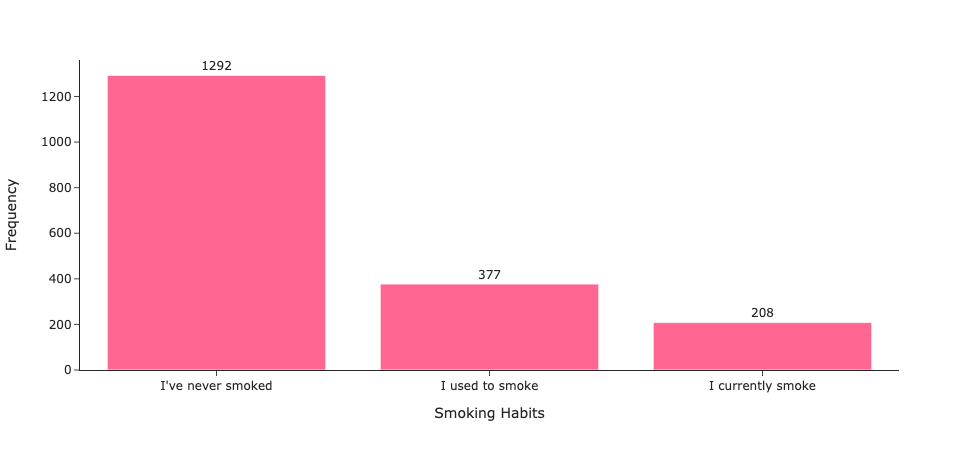

In [15]:
# SMOKING HABITS
smoking_habits =  {"I currently smoke":"I currently smoke",
"I used to smoke":"I used to smoke",
"Used to smoke but stopped in the last 5 years":"I used to smoke",
"I've never smoked":"I've never smoked",
"I've used to smoke":"I used to smoke",
"Not smoking":"I've never smoked",
"Smoking":"I currently smoke"}
def map_smokinghabits(val):
    return smoking_habits[val]
    

# Drop nans    
data_cleaned = data.dropna()

# fix smoking habits
data_cleaned['smoking_habits'] = data_cleaned['smokingHabits'].apply(lambda x:map_smokinghabits(x))
data_cleaned = data_cleaned.drop(columns={'smokingHabits'})

# data_cleaned
# PLot
smoke_fig = px.bar(x=data_cleaned['smoking_habits'].unique(),y=data_cleaned['smoking_habits'].value_counts(),
             template="simple_white",labels={'x':'Smoking Habits','y':'Frequency'},
            text=data_cleaned['smoking_habits'].value_counts())
smoke_fig.update_traces(marker_color='#FF6692')
smoke_fig.data[0].textposition = 'outside'
smoke_fig.write_image('plots/mit_plots/mit_smoking_plotly.eps')
smoke_fig.show()


In [19]:
data_cleaned['Covid Status'].value_counts()

No     1849
Yes      28
Name: Covid Status, dtype: int64

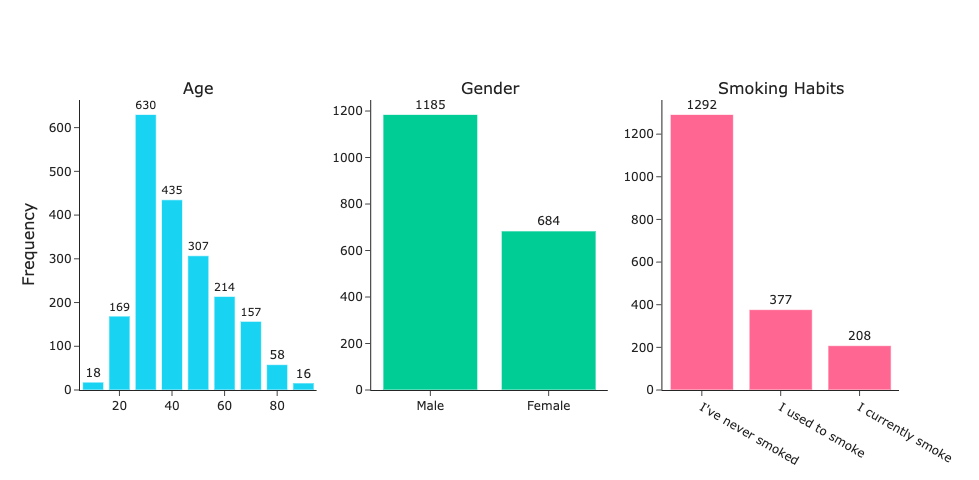

In [147]:
# multiple plots in single fig
from plotly.subplots import make_subplots

# Initialize figure with subplots
fig = make_subplots(
    rows=1, cols=3, subplot_titles=("Age", "Gender", "Smoking Habits"),y_title='Frequency')

fig.add_trace(age_fig['data'][0], row=1, col=1)
fig.add_trace(gender_fig['data'][0], row=1, col=2)
fig.add_trace(smoke_fig['data'][0], row=1, col=3)
fig.update_layout(template='simple_white', height=480)
fig.write_image('plots/mit_plots/mit_single_plotly.eps')
fig.show()

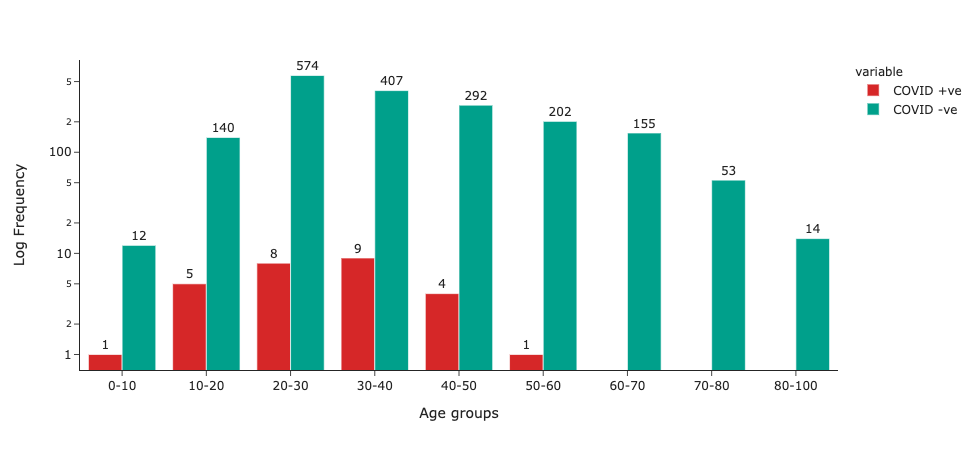

In [148]:
# AGE + diagnosis plots
labels = ['0-10','10-20','20-30','30-40','40-50','50-60','60-70','70-80','80-100']
bins =[0,10,20,30,40,50,60,70,80,100]
age = data['age'].apply(lambda x: int(x) if len(str(x))<=2 else 10)
data_cleaned['age_grouped'] = pd.cut(age.astype(int), bins=bins, labels=labels, right=False)
d = data_cleaned[['Covid Status','age_grouped']].groupby("Covid Status")['age_grouped'].value_counts().unstack(fill_value=0)
# d.loc['percentage(in %)'] = (d.loc['Yes'] / d.loc['No'] * 100).round(1)
# d = d.to_dict()
# d.keys(), [[x['Yes'],x['No']] for x in d.values()]

d = d.transpose().reset_index()
d[['No','Yes']] = d[['No','Yes']].astype(int)
d = d.rename({'Yes':'COVID +ve','No':'COVID -ve'},axis=1)
# PLot
age_diag_fig = px.bar(d, x='age_grouped',y=['COVID +ve','COVID -ve'],
             template="simple_white", barmode='group', labels={'age_grouped':'Age groups','value':'Log Frequency'}, log_y=True)

age_diag_fig.data[0].text = list(d['COVID +ve'].values)
age_diag_fig.data[0].textposition = 'outside'
age_diag_fig.data[1].text = list(d['COVID -ve'].values)
age_diag_fig.data[1].textposition = 'outside'
age_diag_fig.data[0].marker.color = '#D62728'
age_diag_fig.data[1].marker.color = '#00A08B'
age_diag_fig.write_image('plots/mit_age_diagnosis_plotly.eps')
age_diag_fig.show()

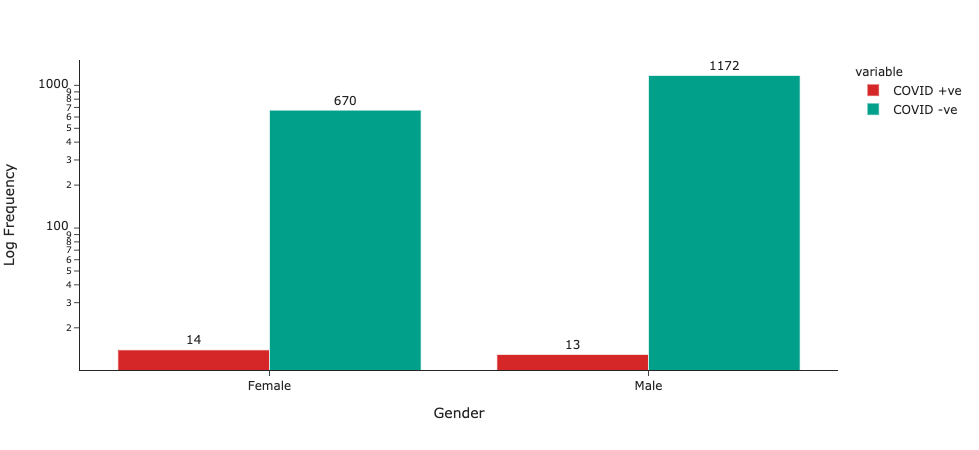

In [149]:
# Gender + diagnosis plots
data_cleaned = data_cleaned[data_cleaned['gender']!='Other']
d = data_cleaned[['Covid Status','gender']].groupby("Covid Status")['gender'].value_counts().unstack(fill_value=0)
d = d.transpose().reset_index()
d[['No','Yes']] = d[['No','Yes']].astype(int)
d = d.rename({'Yes':'COVID +ve','No':'COVID -ve'},axis=1)
# PLot
gender_diag_fig = px.bar(d, x='gender',y=['COVID +ve','COVID -ve'],
             template="simple_white", barmode='group', labels={'gender':'Gender','value':'Log Frequency'}, log_y=True)

gender_diag_fig.data[0].text = list(d['COVID +ve'].values)
gender_diag_fig.data[0].textposition = 'outside'
gender_diag_fig.data[1].text = list(d['COVID -ve'].values)
gender_diag_fig.data[1].textposition = 'outside'
gender_diag_fig.data[0].marker.color = '#D62728'
gender_diag_fig.data[1].marker.color = '#00A08B'
gender_diag_fig.write_image('plots/mit_gender_diagnosis_plotly.eps')
gender_diag_fig.show()

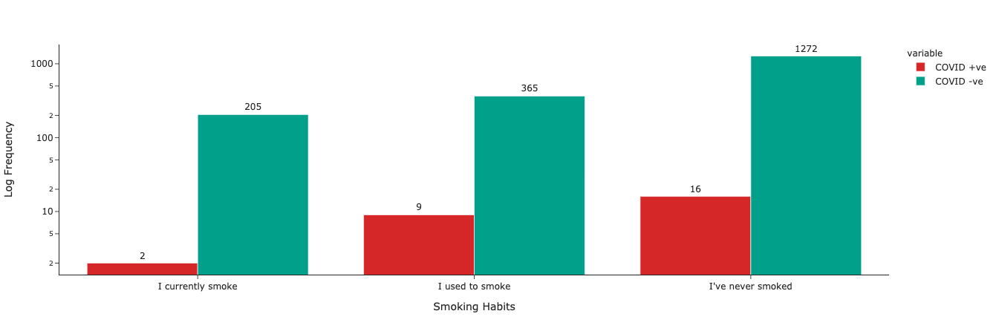

In [150]:
# smoking habits + diagnosis plots
d = data_cleaned[['Covid Status','smoking_habits']].groupby("Covid Status")['smoking_habits'].value_counts().unstack(fill_value=0)
d = d.transpose().reset_index()
d[['No','Yes']] = d[['No','Yes']].astype(int)
d = d.rename({'Yes':'COVID +ve','No':'COVID -ve'},axis=1)
# PLot
smoke_diag_fig = px.bar(d, x='smoking_habits',y=['COVID +ve','COVID -ve'],
             template="simple_white", barmode='group', labels={'smoking_habits':'Smoking Habits','value':'Log Frequency'}, log_y=True)

smoke_diag_fig.data[0].text = list(d['COVID +ve'].values)
smoke_diag_fig.data[0].textposition = 'outside'
smoke_diag_fig.data[1].text = list(d['COVID -ve'].values)
smoke_diag_fig.data[1].textposition = 'outside'
smoke_diag_fig.data[0].marker.color = '#D62728'
smoke_diag_fig.data[1].marker.color = '#00A08B'
smoke_diag_fig.write_image('plots/mit_smoking_habits_diagnosis_plotly.eps')
smoke_diag_fig.show()

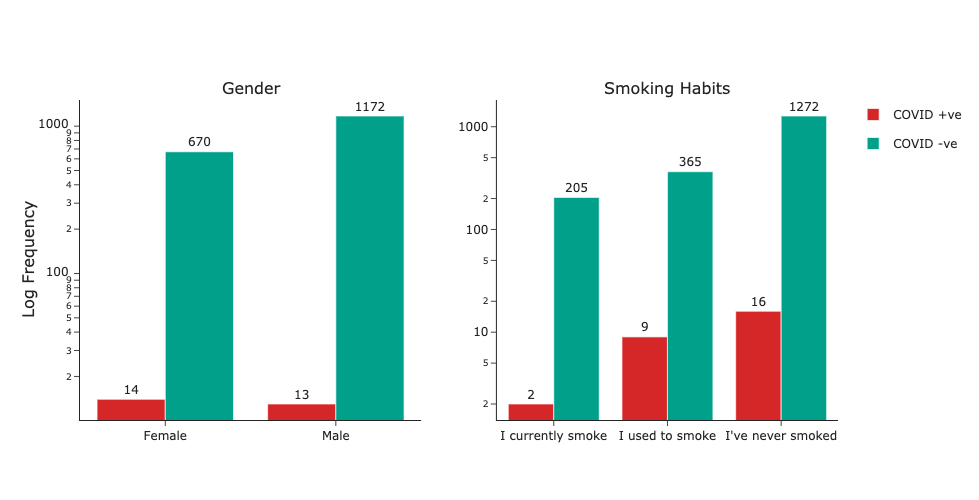

In [168]:
# # multiple plots in single fig
# from plotly.subplots import make_subplots

# # Initialize figure with subplots
# fig = make_subplots(
#     rows=1, cols=3, subplot_titles=("Age", "Gender", "Smoking Habits"),
#     y_title='Log Frequency')


# age_diag_fig['data'][0]['showlegend']=False
# age_diag_fig['data'][1]['showlegend']=False
# gender_diag_fig['data'][0]['showlegend']=False
# gender_diag_fig['data'][1]['showlegend']=False
# # print(age_diag_fig['data'])
# fig.append_trace(age_diag_fig['data'][0], row=1, col=1)
# fig.append_trace(age_diag_fig['data'][1], row=1, col=1)
# fig.append_trace(gender_diag_fig['data'][0], row=1, col=2)
# fig.append_trace(gender_diag_fig['data'][1], row=1, col=2)
# fig.append_trace(smoke_diag_fig['data'][0], row=1, col=3)
# fig.append_trace(smoke_diag_fig['data'][1], row=1, col=3)
# fig.update_layout(template='simple_white',
#     height=500)
# fig.update_yaxes(type="log")    

# # For playing aroudn each plot
# # for i in fig['layout']['margin']:
# #     print(i)
# fig.write_image('plots/mit_single_diag_plotly.eps')

# fig.show()


# wihtout age
# multiple plots in single fig
from plotly.subplots import make_subplots

# Initialize figure with subplots
fig = make_subplots(
    rows=1, cols=2, subplot_titles=("Gender", "Smoking Habits"),
    y_title='Log Frequency')


age_diag_fig['data'][0]['showlegend']=False
age_diag_fig['data'][1]['showlegend']=False
gender_diag_fig['data'][0]['showlegend']=False
gender_diag_fig['data'][1]['showlegend']=False
# print(age_diag_fig['data'])
fig.append_trace(gender_diag_fig['data'][0], row=1, col=1)
fig.append_trace(gender_diag_fig['data'][1], row=1, col=1)
fig.append_trace(smoke_diag_fig['data'][0], row=1, col=2)
fig.append_trace(smoke_diag_fig['data'][1], row=1, col=2)
# fig.append_trace(smoke_diag_fig['data'][0], row=1, col=3)
# fig.append_trace(smoke_diag_fig['data'][1], row=1, col=3)
fig.update_layout(template='simple_white',
    height=500)
fig.update_yaxes(type="log")    

# For playing aroudn each plot
# for i in fig['layout']['margin']:
#     print(i)
fig.write_image('plots/mit_single_diag_plotly.eps')

fig.show()

## Audio Recordings

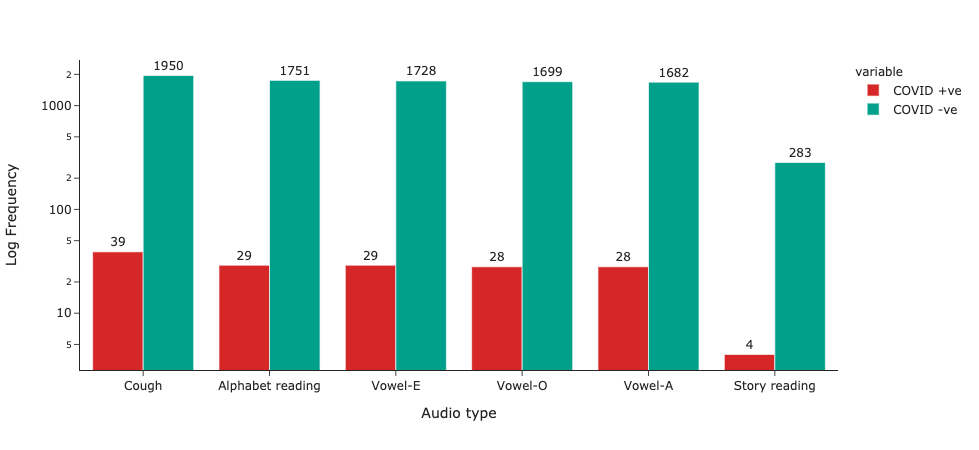

In [279]:
# data variants + diagnosis plots
submissions = json.load(open('/Users/badgod/badgod_documents/Datasets/covid19/covid_mit_audio_data/submissions.json','r'))

submissions_count = {'Yes':{},'No':{}}
def add_recordings_count(main_dict, recordings_dict):
    for key in list(recordings_dict.keys()):
        if key in main_dict:
            main_dict[key]+=1
        else:
            main_dict[key]=1
    return main_dict

for each in submissions:
    if 'covid19' in each['formData']:
        if each['formData']['covid19']['diagnosedCovid19'] == 'No' and 'recordings' in each:
            submissions_count['No'] = add_recordings_count(submissions_count['No'],each['recordings'])
        if each['formData']['covid19']['diagnosedCovid19'] == 'Yes' and 'recordings' in each:
            submissions_count['Yes'] = add_recordings_count(submissions_count['Yes'],each['recordings'])

recordings_df = pd.DataFrame.from_dict(submissions_count, orient='index')
recordings_df = recordings_df.drop('count',axis=1)
recordings_df = recordings_df.rename({"cough":"Cough","alphabet":"Alphabet reading","eeee":"Vowel-E",
                                      "oooo":"Vowel-O","aaaa":"Vowel-A","story":"Story reading"},axis=1)
recordings_df = recordings_df.transpose().reset_index().dropna()


recordings_df = recordings_df.rename({'Yes':'COVID +ve','No':'COVID -ve','index':'Audio type'},axis=1)
recordings_df[['COVID +ve','COVID -ve']] = recordings_df[['COVID +ve','COVID -ve']].astype(int)

# PLot
recordings_diag_fig = px.bar(recordings_df, x='Audio type',y=['COVID +ve','COVID -ve'],
             template="simple_white", barmode='group', labels={'value':'Log Frequency'}, log_y=True)

recordings_diag_fig.data[0].text = list(recordings_df['COVID +ve'].values)
recordings_diag_fig.data[0].textposition = 'outside'
recordings_diag_fig.data[0].marker.color = '#D62728'
recordings_diag_fig.data[1].text = list(recordings_df['COVID -ve'].values)
recordings_diag_fig.data[1].textposition = 'outside'
recordings_diag_fig.data[1].marker.color = '#00A08B'

recordings_diag_fig.write_image('plots/mit_recordings_diag_plotly.eps')
recordings_diag_fig.show()

## Recording samples

### Alphabets

In [204]:
ipd.Audio(folder_path+'/5ee7084ac181770008edf2b3/alphabet.wav')

### AAA

In [203]:
ipd.Audio(folder_path+'/5eea2c7544e9ab000779b491/aaaa.wav')

### Cough

In [205]:
ipd.Audio(folder_path+'/5eea2c7544e9ab000779b491/cough.wav')

### EEE

In [207]:
ipd.Audio(folder_path+'/5eea2c7544e9ab000779b491/eeee.wav')

### OOOO

In [208]:
ipd.Audio(folder_path+'/5eea2c7544e9ab000779b491/oooo.wav')

## Covid vs Non Covid Recordings

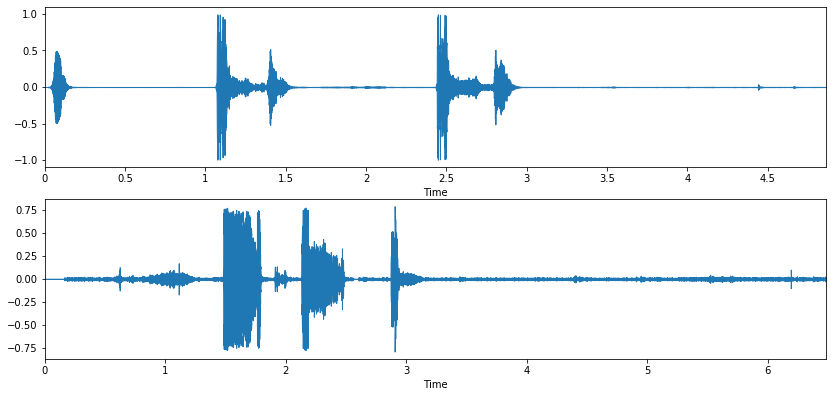

In [253]:
import librosa
%matplotlib inline
import matplotlib.pyplot as plt
import librosa.display

not_covid, sr = librosa.load(folder_path+'/5eea2c7544e9ab000779b491/cough.wav')
covid, ssr = librosa.load(folder_path+'/5e78f5611ca30700071b98d9/cough.wav')
# y_harm, y_perc = librosa.effects.hpss(covid)

plt.figure(figsize=(14, 10))
plt.tight_layout()
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)

plt.subplot(3, 1, 1)
# plt.title('NON COVID SAMPLE')
# librosa.display.waveplot(y_harm, sr=sr, alpha=0.25)
# librosa.display.waveplot(y_perc, sr=sr, color='r', alpha=0.5)
librosa.display.waveplot(not_covid, sr=sr)


plt.subplot(3, 1, 2)
# plt.title('COVID SAMPLE')
librosa.display.waveplot(covid, sr=sr)



# TIMELINE

| Deadline       	| Description                                                                                                     	|
|----------------	|-----------------------------------------------------------------------------------------------------------------	|
| Jan 15, 2021   	| Extensive literature survey of latest work  COVID-19 diagnosis using Audio                                      	|
| Jan 22, 2021   	| Add COVID-19 datasets to existing MIT dataset                                                                   	|
| Jan 29, 2021   	| Start audio analysis on COVID-19 and Neutral samples                                                            	|
| Feb 5, 2021    	| Work on fixing data imbalance issues as COVID-19 samples <10% of entire dataset                                 	|
| Feb 12, 2021   	| Work on creating pipelines for audio representations (MFCC/GFCC/Mel Filters and Acoustic Low level descriptors) 	|
| Feb 19, 2021   	| Work on building Neural Network blocks to accommodate end to end training                                       	|
| March 5, 2021  	| Build modularized pipeline consisting data preprocessing and neural network block to run experiments            	|
| March 12, 2021 	| Evaluate and analyze model results and obtain validations from Advisor and Reader                               	|
| March 19, 2021 	| Begin writing thesis and start preparation to defend thesis                                                     	|
| March 26, 2021 	| Complete Thesis draft 1                                                                                         	|
| March 28, 2021 	| Complete Thesis draft 2                                                                                         	|
| March 30, 2021 	| Complete final Version of thesis                                                                                	|

# COSWARA DATA

In [3]:
coswara_basepath = '/Users/badgod/badgod_documents/Datasets/covid19/coswara_data/Coswara-Data/'
coswara_combined_data = pd.read_csv(coswara_basepath+'combined_data.csv')
coswara_combined_data.head()

,id,a,covid_status,ep,g,l_c,l_l,l_s,rU,asthma,...,bd,st,fever,ftg,mp,loss_of_smell,test_status,pneumonia,diarrhoea,cld
0,DRBAZX64nuVtqBQf13gH7r36Mh52,26,healthy,y,female,United States,Madison,Wisconsin,n,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Jw7YMfwGqMX22UbHh1TTgYMTYWs1,16,healthy,y,female,India,24 pargana,West Bengal,n,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,xa2v8z3Yzgb9dFrq2gEZz6oS7fh1,26,resp_illness_not_identified,y,male,India,Kolkata,West Bengal,n,True,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,xwHQrG0KwjTLJvBYVtVXfHp4JAd2,32,resp_illness_not_identified,y,male,Sri Lanka,Sri Jatawardanapura,Western Province,n,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,xKW2EpGmJcfigLecUTLVXEWQHPg2,22,healthy,y,male,India,Kolkata,West Bengal,n,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
coswara_combined_data = coswara_combined_data.rename({'a':'Age','g':'Gender'},axis=1)
coswara_combined_data.count()

id               1503
Age              1503
covid_status     1503
ep               1503
Gender           1503
l_c              1503
l_l              1312
l_s              1503
rU                823
asthma             59
cough             102
smoker            110
ht                 91
cold               81
diabetes           76
um                465
ihd                 5
bd                 20
st                 51
fever              59
ftg                27
mp                 26
loss_of_smell      21
test_status        90
pneumonia           4
diarrhoea           1
cld                 3
dtype: int64

In [5]:
required_columns= ['Age','Gender','covid_status']
coswara_combined_data = coswara_combined_data[required_columns]
coswara_combined_data = coswara_combined_data.dropna()
coswara_combined_data.count()

Age             1503
Gender          1503
covid_status    1503
dtype: int64

In [6]:
coswara_combined_data['covid_status'] = coswara_combined_data['covid_status'].apply(
    lambda x: 'COVID +ve' if x in ['positive_mild','positive_asymp', 'positive_moderate'] else 'COVID -ve')
coswara_combined_data.head()

,Age,Gender,covid_status
0,26,female,COVID -ve
1,16,female,COVID -ve
2,26,male,COVID -ve
3,32,male,COVID -ve
4,22,male,COVID -ve


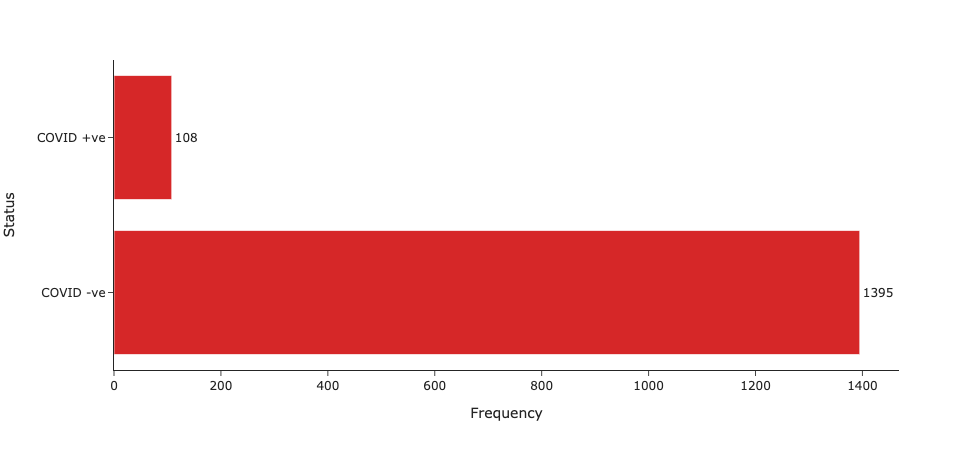

In [10]:
# COVID positive negative split
covid_status_fig = px.bar(x=coswara_combined_data['covid_status'].value_counts(),y=coswara_combined_data['covid_status'].value_counts().index,
             template="simple_white",labels={'x':'Frequency','y':'Status'},
            text=coswara_combined_data['covid_status'].value_counts(), orientation='h')
covid_status_fig.update_traces(marker_color='#D62728')
covid_status_fig.data[0].textposition = 'outside'
covid_status_fig.write_image('plots/coswara_plots/coswara_covid_status.eps')
covid_status_fig.show()


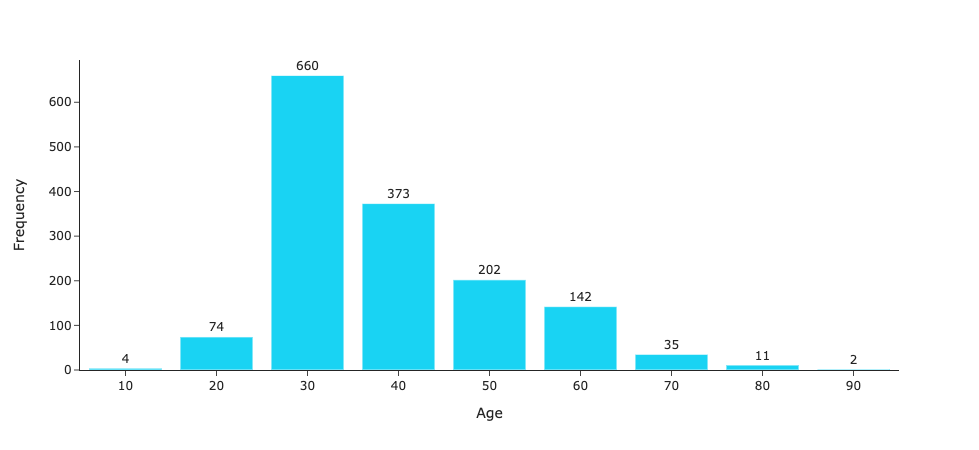

In [157]:
# Age plots
c, rnge = np.histogram(coswara_combined_data['Age'].values,bins=[x*10 for x in range(0,10)])
age_fig = px.bar(x=rnge[1:],y=c,template="simple_white",labels={'x':'Age','y':'Frequency'},text=c)
age_fig.update_traces(marker_color='#19D3F3')
age_fig.data[0].textposition = 'outside'
age_fig.write_image('plots/coswara_plots/coswara_age_plotly.eps')
age_fig.show()

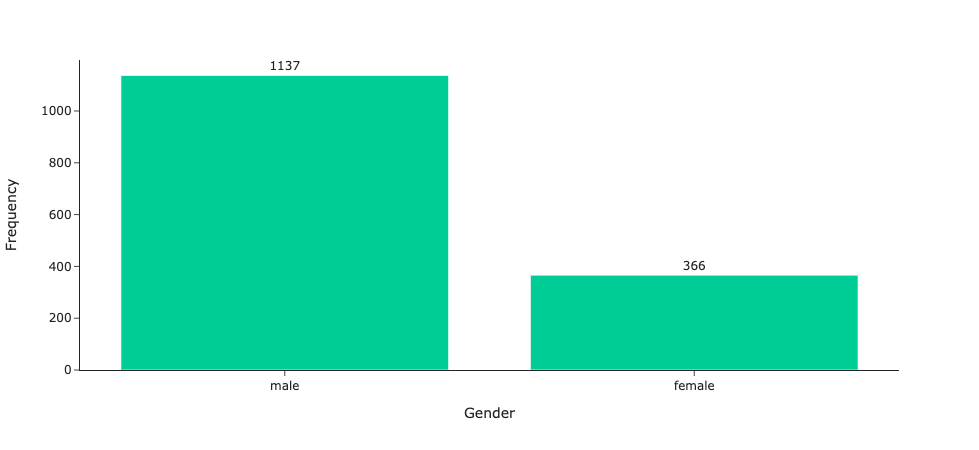

In [158]:
# GENDER
gender_fig = px.bar(x=coswara_combined_data['Gender'].value_counts().index,y=coswara_combined_data['Gender'].value_counts(),
             template="simple_white",labels={'x':'Gender','y':'Frequency'},
            text=coswara_combined_data['Gender'].value_counts())
gender_fig.update_traces(marker_color='#00CC96')
gender_fig.data[0].textposition = 'outside'
gender_fig.write_image('plots/coswara_plots/coswara_gender_plotly.eps')
gender_fig.show()

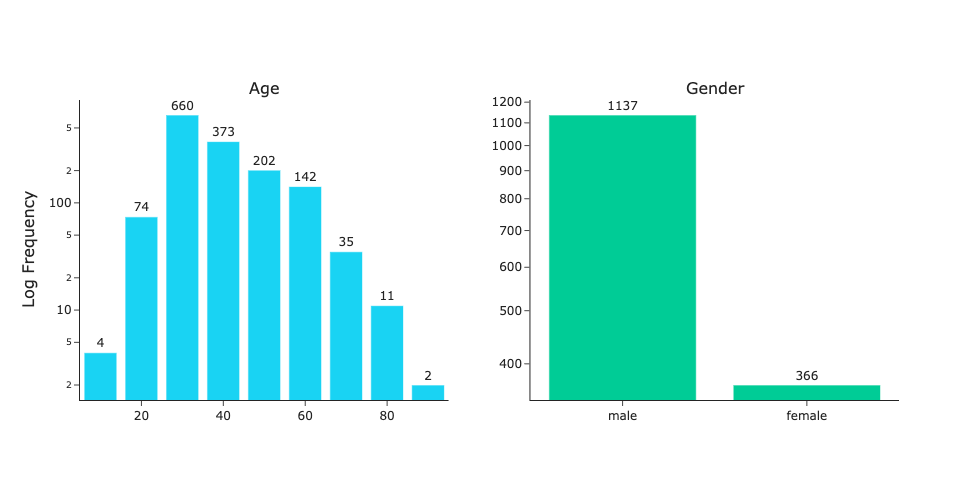

In [165]:
# coswara multiple plots in single fig
from plotly.subplots import make_subplots

# Initialize figure with subplots
fig = make_subplots(
    rows=1, cols=2, subplot_titles=("Age", "Gender"),
    y_title='Log Frequency')

fig.append_trace(age_fig['data'][0], row=1, col=1)
fig.append_trace(gender_fig['data'][0], row=1, col=2)
fig.update_layout(template='simple_white',
    height=480)
fig.update_yaxes(type="log")    
fig.write_image('plots/coswara_plots/coswara_single_plotly.eps')

fig.show()

In [348]:
coswara_combined_data['covid_status'].value_counts()

COVID -ve    1395
COVID +ve     108
Name: covid_status, dtype: int64

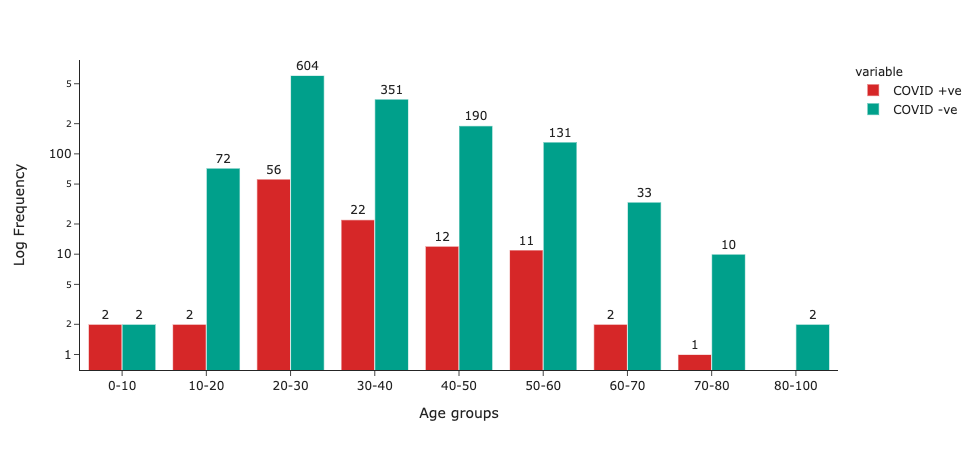

In [161]:
# coswara AGE + diagnosis plots
labels = ['0-10','10-20','20-30','30-40','40-50','50-60','60-70','70-80','80-100']
bins =[0,10,20,30,40,50,60,70,80,100]
coswara_combined_data['age_grouped'] = pd.cut(coswara_combined_data['Age'].astype(int), bins=bins, labels=labels, right=False)
d = coswara_combined_data[['covid_status','age_grouped']].groupby("covid_status")['age_grouped'].value_counts().unstack(fill_value=0)
d = d.transpose().reset_index()
# PLot
coswara_age_diag_fig = px.bar(d, x='age_grouped',y=['COVID +ve','COVID -ve'],
             template="simple_white", barmode='group', labels={'age_grouped':'Age groups','value':'Log Frequency'}, log_y=True)

coswara_age_diag_fig.data[0].text = list(d['COVID +ve'].values)
coswara_age_diag_fig.data[0].textposition = 'outside'
coswara_age_diag_fig.data[1].text = list(d['COVID -ve'].values)
coswara_age_diag_fig.data[1].textposition = 'outside'
coswara_age_diag_fig.data[0].marker.color = '#D62728'
coswara_age_diag_fig.data[1].marker.color = '#00A08B'
coswara_age_diag_fig.write_image('plots/coswara_plots/coswara_age_diagnosis_plotly.eps')
coswara_age_diag_fig.show()

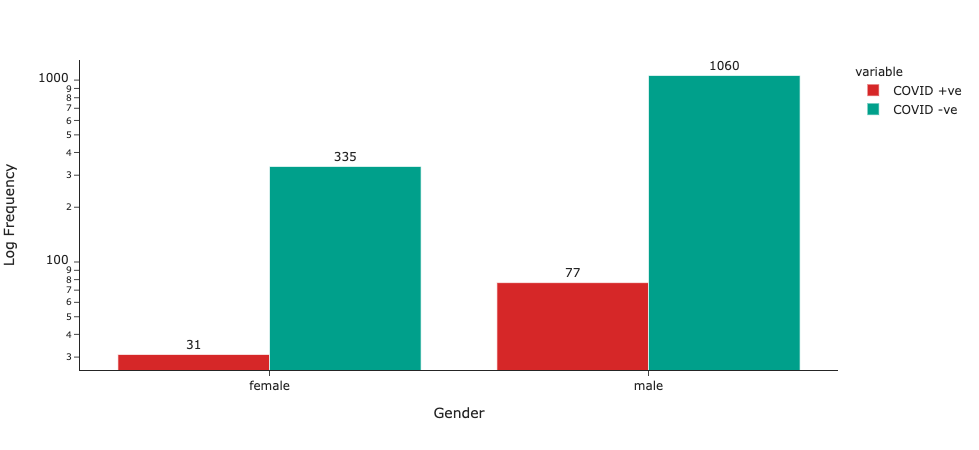

In [162]:
# Gender + diagnosis plots
d = coswara_combined_data[['covid_status','Gender']].groupby("covid_status")['Gender'].value_counts().unstack(fill_value=0)
d = d.transpose().reset_index()

# PLot
coswara_gender_diag_fig = px.bar(d, x='Gender',y=['COVID +ve','COVID -ve'],
             template="simple_white", barmode='group', labels={'gender':'Gender','value':'Log Frequency'}, log_y=True)

coswara_gender_diag_fig.data[0].text = list(d['COVID +ve'].values)
coswara_gender_diag_fig.data[0].textposition = 'outside'
coswara_gender_diag_fig.data[1].text = list(d['COVID -ve'].values)
coswara_gender_diag_fig.data[1].textposition = 'outside'
coswara_gender_diag_fig.data[0].marker.color = '#D62728'
coswara_gender_diag_fig.data[1].marker.color = '#00A08B'
coswara_gender_diag_fig.write_image('plots/coswara_plots/coswara_gender_diagnosis_plotly.eps')
coswara_gender_diag_fig.show()

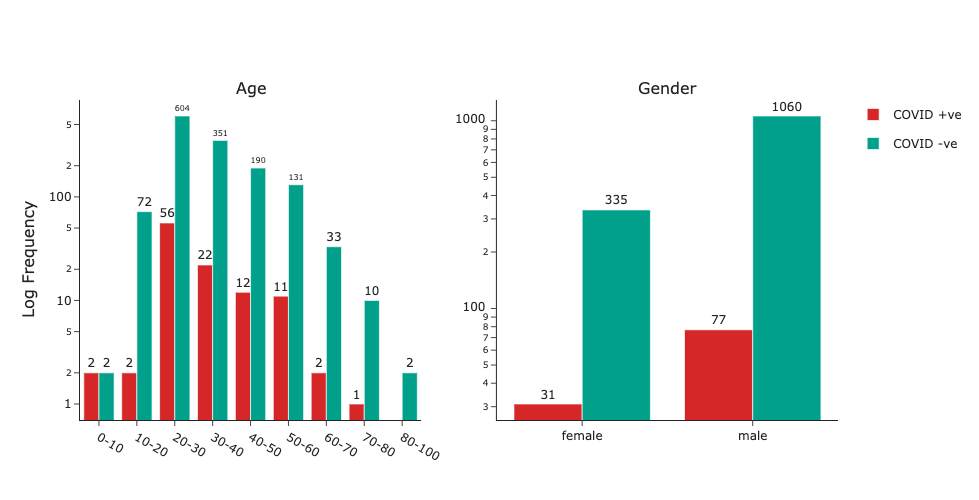

In [163]:
# multiple plots in single diag fig
from plotly.subplots import make_subplots

# Initialize figure with subplots
fig = make_subplots(
    rows=1, cols=2, subplot_titles=("Age", "Gender"),
    y_title='Log Frequency')

coswara_age_diag_fig['data'][0]['showlegend']=False
coswara_age_diag_fig['data'][1]['showlegend']=False

fig.append_trace(coswara_age_diag_fig['data'][0], row=1, col=1)
fig.append_trace(coswara_age_diag_fig['data'][1], row=1, col=1)
fig.append_trace(coswara_gender_diag_fig['data'][0], row=1, col=2)
fig.append_trace(coswara_gender_diag_fig['data'][1], row=1, col=2)
fig.update_layout(template='simple_white',
    height=500)
fig.update_yaxes(type="log")    

fig.write_image('plots/coswara_plots/coswara_single_diag_plotly.eps')

fig.show()

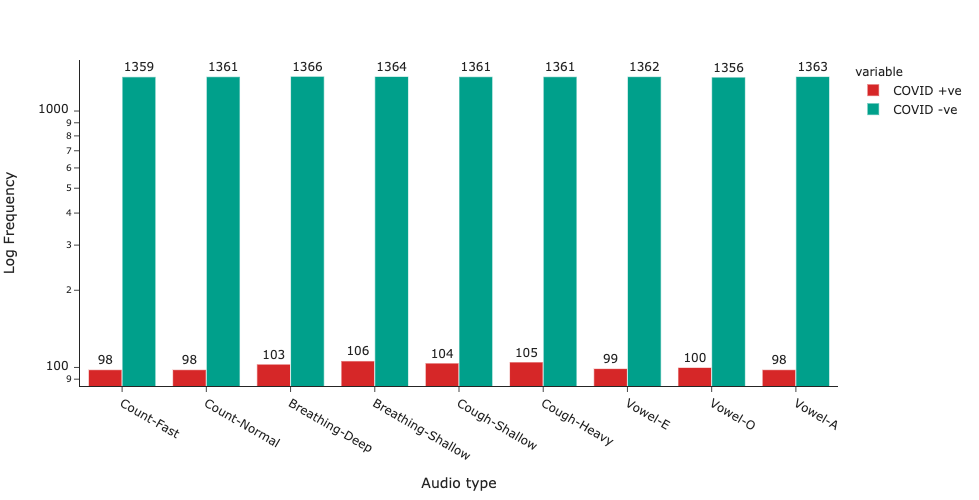

In [164]:
coswara_data = {
    "Count-Fast": {
        "negative": 1359,
        "positive": 98
    },
    "Count-Normal": {
        "negative": 1361,
        "positive": 98
    },
    "Breathing-Deep": {
        "negative": 1366,
        "positive": 103
    },
    "Breathing-Shallow": {
        "negative": 1364,
        "positive": 106
    },
    "Cough-Shallow": {
        "negative": 1361,
        "positive": 104
    },
    "Cough-Heavy": {
        "negative": 1361,
        "positive": 105
    },
    "Vowel-E": {
        "negative": 1362,
        "positive": 99
    },
    "Vowel-O": {
        "negative": 1356,
        "positive": 100
    },
    "Vowel-A": {
        "negative": 1363,
        "positive": 98
    }
    
}
df = pd.DataFrame(coswara_data)
df = df.transpose().reset_index()
df = df.rename({'index':'Audio type', 'positive':'COVID +ve','negative':'COVID -ve'},axis=1)
coswara_recordings_diag_fig = px.bar(df, x='Audio type',y=['COVID +ve','COVID -ve'],
             template="simple_white", barmode='group', labels={'value':'Log Frequency'}, log_y=True)

coswara_recordings_diag_fig.data[0].text = list(df['COVID +ve'].values)
coswara_recordings_diag_fig.data[0].textposition = 'outside'
coswara_recordings_diag_fig.data[0].marker.color = '#D62728'
coswara_recordings_diag_fig.data[1].text = list(df['COVID -ve'].values)
coswara_recordings_diag_fig.data[1].textposition = 'outside'
coswara_recordings_diag_fig.data[1].marker.color = '#00A08B'
coswara_recordings_diag_fig.update_layout(height=500)
coswara_recordings_diag_fig.write_image('plots/coswara_plots/coswara_recordings_diag_plotly.eps')
coswara_recordings_diag_fig.show()

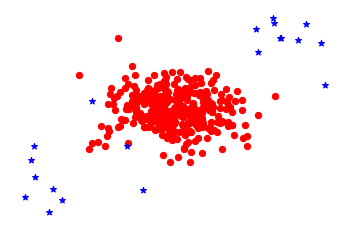

In [121]:
# center1 = (50, 60)
# center2 = (60, 60)
# distance = 10


# x1 = np.random.uniform(center1[0], center1[0] + distance, size=(500,))
# y1 = np.random.normal(center1[1], distance, size=(500,)) 

# x2 = np.random.uniform(center2[0], center2[0] + distance, size=(100,))
# y2 = np.random.normal(center2[1], distance, size=(100,)) 

# plt.scatter(x1, y1)
# plt.scatter(x2[:10], y2[:10])

from sklearn.datasets.samples_generator import make_blobs

centers = [(-5, -5), (-2,-2),[-7,-8]]
cluster_std = [0.8, 1,1]

X, y = make_blobs(n_samples=1000, cluster_std=cluster_std, centers=centers, n_features=2, random_state=1)

plt.scatter(X[y == 0, 0], X[y == 0, 1], color="red", s=40, label="Cluster1")
plt.scatter(X[y == 1, 0][:10], X[y == 1, 1][:10], color="blue", s=40, label="Cluster2",marker='*')
plt.scatter(X[y == 2, 0][:10], X[y == 2, 1][:10], color="blue", s=40, label="Cluster3",marker='*')
plt.axis('off')
plt.savefig('plots/anomalies.eps',format='eps',bbox_inches='tight')
plt.show()

In [240]:
import pysptk
import time
import wavio
import subprocess
y, sr = librosa.load('/Users/badgod/badgod_documents/Datasets/covid19/covid_mit_audio_data/5e7a0c4261ba260008b83a2f/aaaa.wav')

def get_shimmer_jitter_from_opensmile(audio, index, sr):
    def delete_file(path):
        if os.path.exists(path):
            os.remove(path)
    wavio.write(f'temp_{str(index)}.wav', audio, sr, sampwidth=3)
    subprocess.call(
            ["SMILExtract", "-C", os.environ['OPENSMILE_CONFIG_DIR'] + "/IS10_paraling.conf", "-I",
             f"temp_{str(index)}.wav", "-O",
             f"temp_{str(index)}.arff"])
    # Read file and extract shimmer and jitter features from the generated arff file
    file = open(f"temp_{str(index)}.arff", "r")
    data = file.readlines()

    # First 3 values are title, empty line and name | Last 5 values are numeric data,
    # and bunch of empty lines and unwanted text
    # headers = data[3:-5]

    headers = data[3:data.index('@data\n')]
    headers = headers[:headers.index('@attribute class numeric\n')]

    # Last line of data is where the actual numeric data is. It is in comma separated string format. After splitting,
    # remove the first value which is name and the last value which is class
    numeric_data = data[-1].split(',')[1:-1]

    assert len(headers) == len(numeric_data), "Features generated from opensmile are not matching with its headers"
#     shi, ji = [], []
#     for e, h in enumerate(headers):
#         if 'shimmer' in h:
#             shi.append(h.replace('@attribute','').replace('\n','').strip()) # numeric_data[e]
#         if 'jitter' in h:
#             ji.append(h.replace('@attribute','').replace('\n','').strip())  # numeric_data[e]
# #     print(ji)
# #     print(shi)
# #     print(len(ji), len(shi))
#     for x,y in zip(ji, shi):
#         print(x.replace('@attribute','').replace('\n','').strip(),' --- ',y.replace('@attribute','').replace('\n','').strip())
#     for i in ji[len(shi):]:
#         print(i.replace('@attribute','').replace('\n','').strip())
    # data_needed = {x.strip(): float(numeric_data[e]) for e, x in enumerate(headers) if 'jitter' in x or 'shimmer' in x}
    data_needed = [float(numeric_data[e]) for e, x in enumerate(headers) if 'jitter' in x or 'shimmer' in x]

    # clean up all files
    delete_file(f'temp_{str(index)}.wav')
    delete_file(f'temp_{str(index)}.arff')
    return np.array(data_needed).reshape(1,-1)

zero_crossing_rate = librosa.feature.zero_crossing_rate(y)
zero_crossing = librosa.zero_crossings(y).astype(int)
f0 = pysptk.swipe(y.astype(np.float64), fs=sr, hopsize=510, min=60, max=240,otype="f0").reshape(1,-1)
pitch = pysptk.swipe(y.astype(np.float64), fs=sr, hopsize=510, min=60, max=240,otype="pitch").reshape(1, -1)
shimmer_jitter = get_shimmer_jitter_from_opensmile(y, time.time(), sr)
print(zero_crossing.shape, zero_crossing_rate.shape, f0.shape, pitch.shape, shimmer_jitter.shape, y.shape)

(109133,) (1, 214) (1, 214) (1, 214) (1, 114) (109133,)


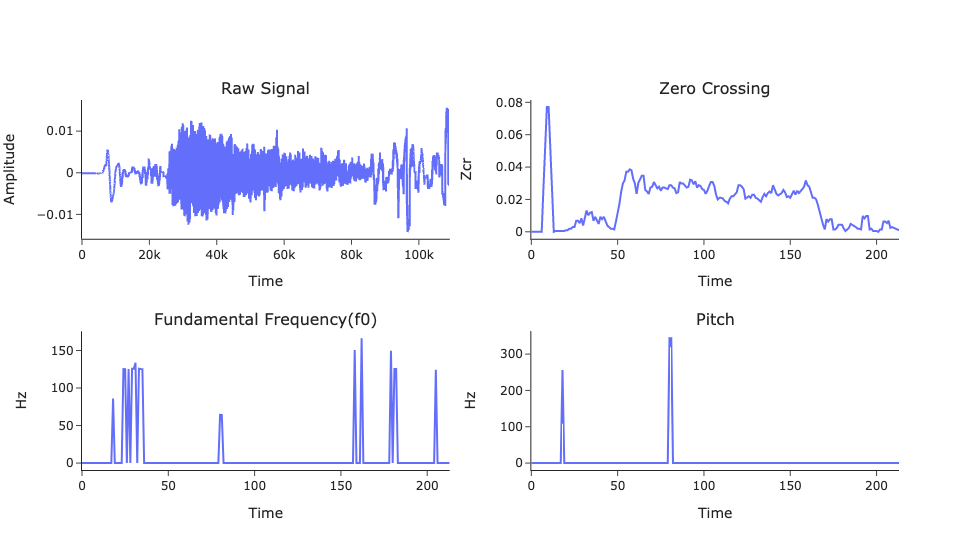

In [249]:
# multiple plots in single diag fig
from plotly.subplots import make_subplots

# Initialize figure with subplots
fig = make_subplots(
    rows=2, cols=2, subplot_titles=("Raw Signal","Zero Crossing", "Fundamental Frequency(f0)","Pitch"))

fig.append_trace(px.line(x=[x for x in range(len(y))],y=y)['data'][0], row=1, col=1)
fig.update_yaxes(title_text="Amplitude", row=1, col=1)

fig.append_trace(px.line(x=[x for x in range(len(zero_crossing_rate[0]))],y=zero_crossing_rate[0])['data'][0], row=1, col=2)
fig.update_yaxes(title_text="Zcr", row=1, col=2)

fig.append_trace(px.line(x=[x for x in range(len(f0[0]))],y=f0[0])['data'][0], row=2, col=1)
fig.update_yaxes(title_text="Hz",row=2, col=1)

fig.append_trace(px.line(x=[x for x in range(len(pitch[0]))],y=pitch[0])['data'][0], row=2, col=2)
fig.update_yaxes(title_text="Hz",row=2, col=2)

fig.update_layout(template='simple_white', height=550, width=1200)
fig.update_xaxes(title_text="Time")
fig.write_image('plots/llds.eps')
fig.show()

# import glob
import os
import librosa
from tqdm import tqdm
from collections import defaultdict
import scipy.io.wavfile
import pandas as pd
counter = defaultdict(lambda: defaultdict(int)) # {'positive':defaultdict(int),'negative':defaultdict(int)}
all_counter = defaultdict(lambda: defaultdict(int)) # {'positive':defaultdict(int),'negative':defaultdict(int)}
flags = {}
path ='/Users/badgod/badgod_documents/Datasets/covid19/coswara_data/Coswara-Data/'
main_folders = glob.glob(path+'Extracted_data/*')
covid_flags = ['positive_mild','positive_asymp', 'positive_moderate']
df = pd.read_csv(path+'/combined_data.csv')
def get_status_for_id(id):    
    val = df[df['id'] == id]['covid_status']
    if val
    if val in covid_flags:
        return 'positive'
    else:
        return 'negative'

for e, root in tqdm(enumerate(main_folders)):
    print('Folder ',root.split('/')[-1], e,'/',len(main_folders))
    if os.path.isdir(root):
        for each_folder in glob.glob(root+'/*'):
            if os.path.isdir(each_folder):
                id_ = each_folder.split('/')[-1]
                covid_status = get_status_for_id(id_)
                wavs = glob.glob(each_folder+'/*.wav')
                for each in wavs:
                    data_type = each.split('/')[-1]
                    try:
                        all_counter[data_type][covid_status]+=1
                        sr, y = scipy.io.wavfile.read(each)
                    except Exception as e:
                        print('Exception ', e, each)
                        continue
                    if y.shape[0]/sr <1:
                        continue
                    else:
                        counter[data_type][covid_status]+=1
print(json.dumps(counter, indent=4))
print(json.dumps(all_counter, indent=4))

In [ ]:
counter

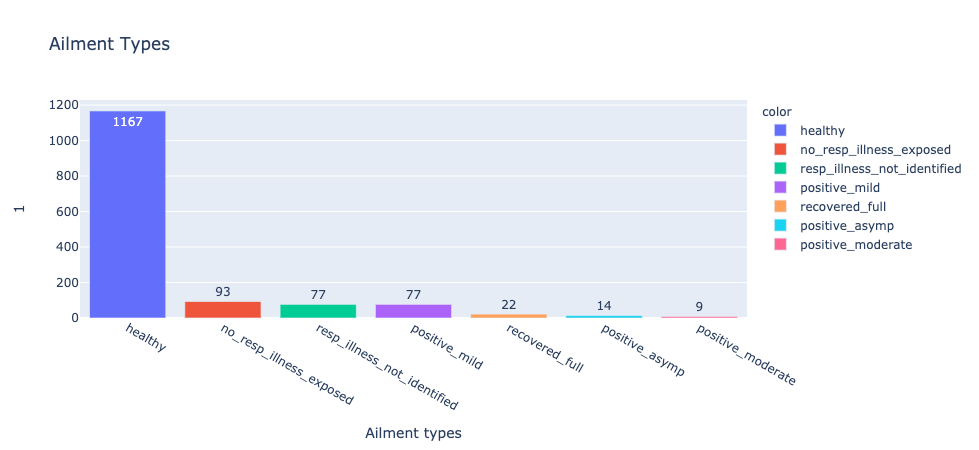

In [71]:
covid_status = pd.DataFrame(coswara_combined_data['covid_status'].value_counts().to_dict(),index=[1]).T
covid_status
fig = px.bar(covid_status, x=covid_status.index, y=1, labels=dict(x='Ailment types',y='Count'),color=covid_status.index,text=1,title='Ailment Types')
fig.show()

In [28]:
import librosa
y, sr =librosa.load('/Users/badgod/badgod_documents/Datasets/covid19/covid_mit_audio_data/5ea99ebf6ba81800073f6ed6/count.wav', sr=22050)

In [29]:
len(y), len(y)/sr

(462874, 20.99201814058957)

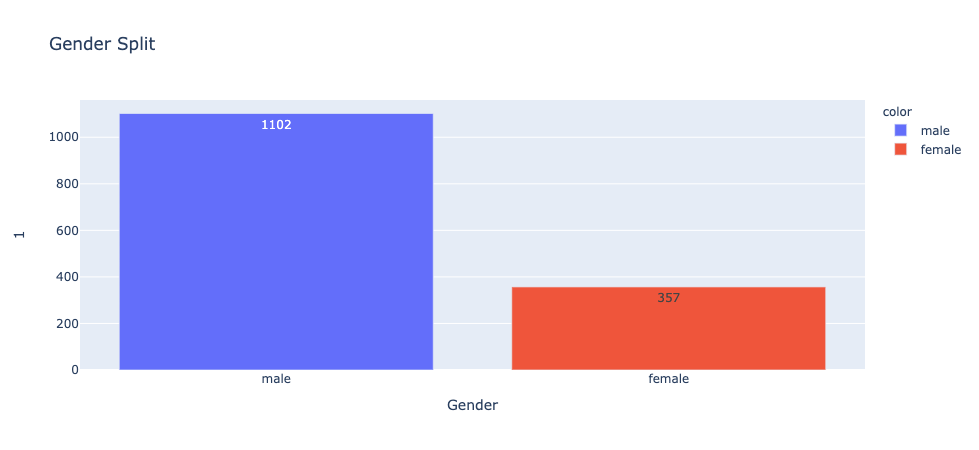

In [72]:
coswara_gender = pd.DataFrame(coswara_combined_data['g'].value_counts().to_dict(),index=[1]).T
coswara_gender
fig = px.bar(coswara_gender, x=coswara_gender.index, y=1, labels=dict(x='Gender',y='Count'),color=coswara_gender.index,text=1,title='Gender Split')
fig.show()

In [8]:
import glob
import os
import subprocess
for path in glob.glob(coswara_basepath+'/2*'):
    print("cat",path+"/*.tar.gz.*",">","file_name.tar.gz")

cat /Users/badgod/coswara_data/Coswara-Data/20200413/*.tar.gz.* > file_name.tar.gz
cat /Users/badgod/coswara_data/Coswara-Data/20200820/*.tar.gz.* > file_name.tar.gz
cat /Users/badgod/coswara_data/Coswara-Data/20200415/*.tar.gz.* > file_name.tar.gz
cat /Users/badgod/coswara_data/Coswara-Data/20200424/*.tar.gz.* > file_name.tar.gz
cat /Users/badgod/coswara_data/Coswara-Data/20200502/*.tar.gz.* > file_name.tar.gz
cat /Users/badgod/coswara_data/Coswara-Data/20200505/*.tar.gz.* > file_name.tar.gz
cat /Users/badgod/coswara_data/Coswara-Data/20200504/*.tar.gz.* > file_name.tar.gz
cat /Users/badgod/coswara_data/Coswara-Data/20200707/*.tar.gz.* > file_name.tar.gz
cat /Users/badgod/coswara_data/Coswara-Data/20200901/*.tar.gz.* > file_name.tar.gz
cat /Users/badgod/coswara_data/Coswara-Data/20200930/*.tar.gz.* > file_name.tar.gz
cat /Users/badgod/coswara_data/Coswara-Data/20201012/*.tar.gz.* > file_name.tar.gz
cat /Users/badgod/coswara_data/Coswara-Data/20201031/*.tar.gz.* > file_name.tar.gz
cat 

In [1]:
# PLot spectrograms

import librosa
import librosa.display

import scipy
from spafe.features.gfcc import gfcc


filename = '/Users/badgod/badgod_documents/Datasets/covid19/covid_mit_audio_data/5e7a0c7061ba260008b83a30/count.wav'
y, sr = librosa.load(filename)

def mfcc_features(audio, sampling_rate, normalise=False):
    mfcc = librosa.feature.mfcc(y=audio, n_mfcc=40, sr=sampling_rate)
    if normalise:
        mfcc_norm = np.mean(mfcc.T, axis=0)
        return mfcc_norm
    else:
        return mfcc


def mel_filters(audio, sampling_rate, normalise=False):
    mel_spec = librosa.feature.melspectrogram(y=audio, n_mels=40, sr=sampling_rate)
    if normalise:
        return np.mean(librosa.power_to_db(mel_spec, ref=np.max).T)
    else:
        return librosa.power_to_db(mel_spec, ref=np.max)
    
def mel_filters_with_spectrogram(audio, sampling_rate, filename, normalise=False):
    plt.figure()
    logmel = librosa.feature.melspectrogram(y=audio, n_mels=40, sr=sampling_rate)
    logmel = librosa.power_to_db(logmel, ref=np.max)
    plt.title('Spectrogram')
    librosa.display.specshow(logmel,x_axis='time', y_axis='log')
    plt.savefig(filename, format='eps')
    plt.close()
    
def mfcc_with_spectrogram(audio, sampling_rate, filename, normalise=False):
    plt.figure()
    mfcc = librosa.feature.mfcc(y=audio, n_mfcc=40, sr=sampling_rate)
    mfcc = librosa.power_to_db(mfcc, ref=np.max)
    librosa.display.specshow(mfcc)
    plt.savefig(filename, format='eps')
    plt.close()
    
def mfcc_gfcc_fbank(audio, sampling_rate, filename, normalise=False):
    f, axarr = plt.subplots(nrows=1,ncols=2, figsize=(15,5))
    axarr[0].set(title='MFCC')
    axarr[1].set(title='Mel Filter Banks')

    mfcc = librosa.feature.mfcc(y=audio, n_mfcc=40, sr=sampling_rate)
    librosa.display.specshow(mfcc, ax=axarr[0],x_axis='time', y_axis='log')
    
    
    logmel = librosa.feature.melspectrogram(y=audio, n_mels=40, sr=sampling_rate)
    logmel = librosa.power_to_db(logmel, ref=np.max)
    librosa.display.specshow(logmel, ax=axarr[1],x_axis='time', y_axis='log')
    
    plt.savefig(filename,format='eps')
    plt.close()
    
# mfcc_gfcc_fbank(y,sr,'mfcc_fbank.eps')
mel_filters_with_spectrogram(y,sr,'spectrogram.eps')


NameError: name 'plt' is not defined

/Users/badgod/commonprojects/lib/python3.7/site-packages/ipykernel_launcher.py:5: DeprecationWarning:

This function is deprecated. Please call randint(0, 100 + 1) instead

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


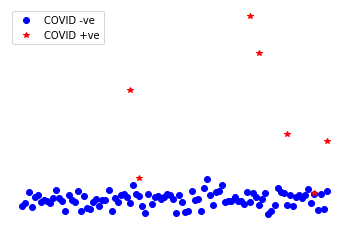

In [24]:
import numpy as np
def plt_points(x,y,anomaly, filename):
    plt.figure()
    plt.plot(y,x,linestyle="",marker="o",color='blue', label='COVID -ve')
    plt.plot(np.random.random_integers(0,100,len(anomaly)),anomaly,linestyle="",marker="*",color='red', label='COVID +ve')
    plt.legend(loc="upper left")
    plt.axis('off')
    plt.savefig(filename, format='eps')
    plt.show()
    plt.close()

x = list(np.random.randn(100))
anomaly=[20,25,15,9,8,3,1]
# x.extend(anomaly)

y = range(len(x))
np.random.shuffle(x)
plt_points(x,y, anomaly, filename='anomalies.eps')

   sepal_length  sepal_width  petal_length  petal_width species  species_id
0           5.1          3.5           1.4          0.2  setosa           1
1           4.9          3.0           1.4          0.2  setosa           1
2           4.7          3.2           1.3          0.2  setosa           1
3           4.6          3.1           1.5          0.2  setosa           1
4           5.0          3.6           1.4          0.2  setosa           1


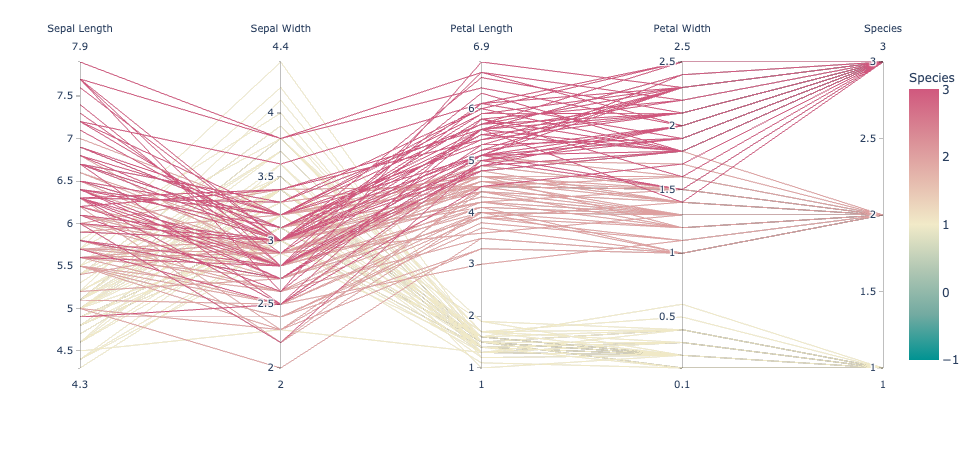

In [253]:
import plotly.express as px
df = px.data.iris()
print(df.head())

df = {
    
}
fig = px.parallel_coordinates(df, color="species_id", labels={"species_id": "Species",
                "sepal_width": "Sepal Width", "sepal_length": "Sepal Length",
                "petal_width": "Petal Width", "petal_length": "Petal Length", },
                             color_continuous_scale=px.colors.diverging.Tealrose,
                             color_continuous_midpoint=1)
fig.show()